# LIMPIEZA DE DATOS DE TODOS LOS JUGADORES PARA EL GIROSCOPIO

In [18]:
#librerias
import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
import numpy as np
from scipy.signal import detrend
from fastdtw import dtw
import csv
from scipy.ndimage import gaussian_filter
import win32api

from scipy.signal import savgol_filter
from scipy.signal import medfilt
import pywt
from scipy.signal import detrend


Nombre del DataFrame: J1_Dretes_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.004523  0.003326 -0.002395   1697802318956
1  0.002395 -0.000665  0.002395   1697802318976
2 -0.004390  0.004922 -0.001463   1697802318992
3 -0.003326  0.003326  0.000665   1697802318996
4  0.004922  0.003991 -0.001330   1697802319008


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             2
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




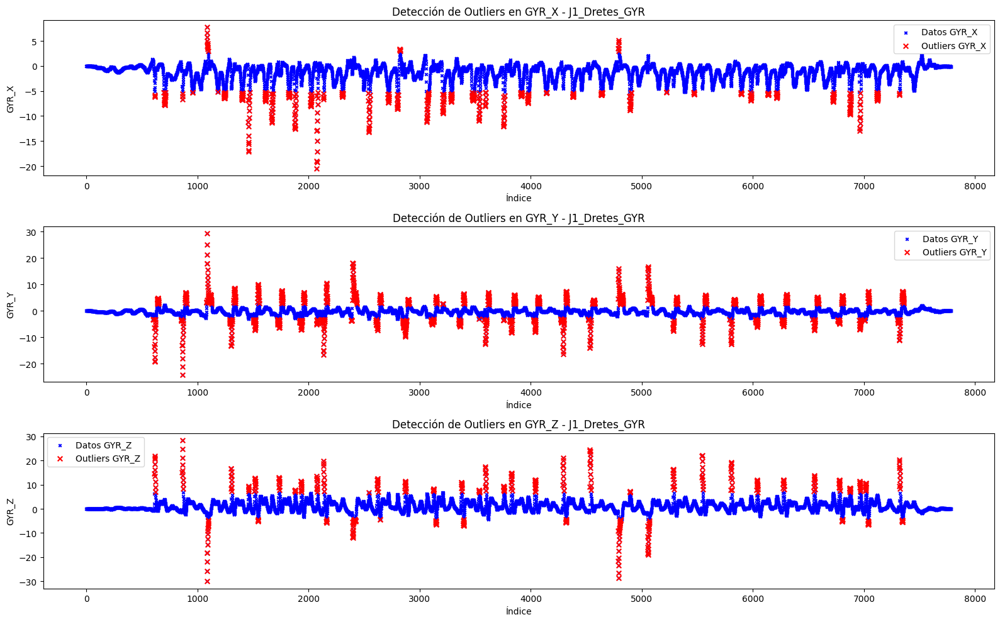

Nombre del DataFrame: J1_Reves_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.003060  0.003858 -0.000399   1697802541191
1  0.004124  0.000133  0.004257   1697802541210
2 -0.003858  0.003326  0.000266   1697802541221
3 -0.002261  0.001064 -0.001463   1697802541237
4  0.001596  0.004124  0.003060   1697802541241


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             5
GYR_Y             1
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




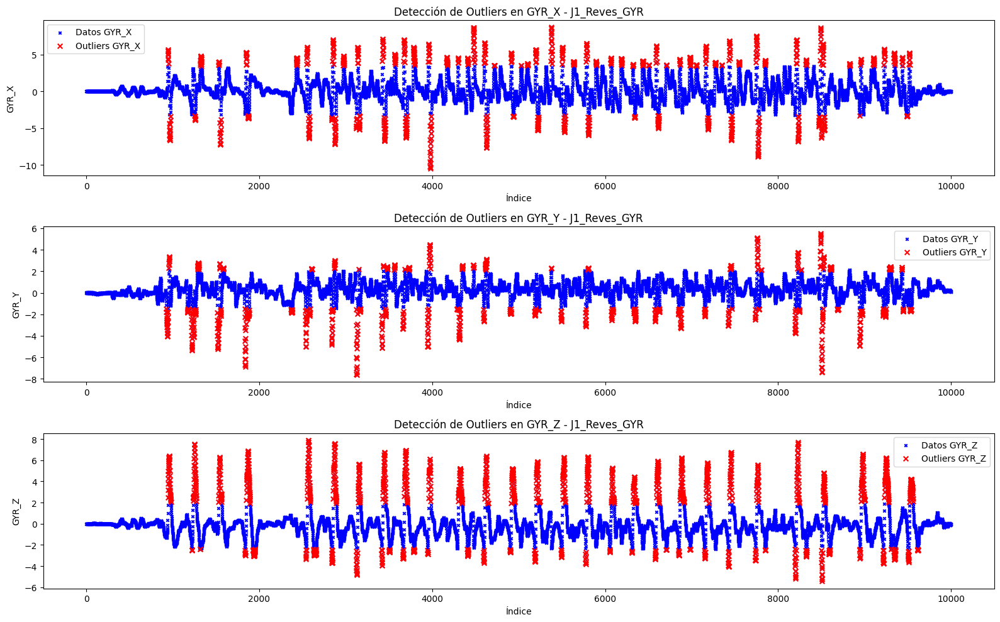

Nombre del DataFrame: J1_Serve_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.002528 -0.000665 -0.003592   1697803103974
1  0.003991  0.003725 -0.001197   1697803103985
2  0.004257 -0.002395  0.002128   1697803103994
3  0.002794 -0.004656  0.001064   1697803104004
4 -0.002661 -0.001596 -0.004656   1697803104014


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             5
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




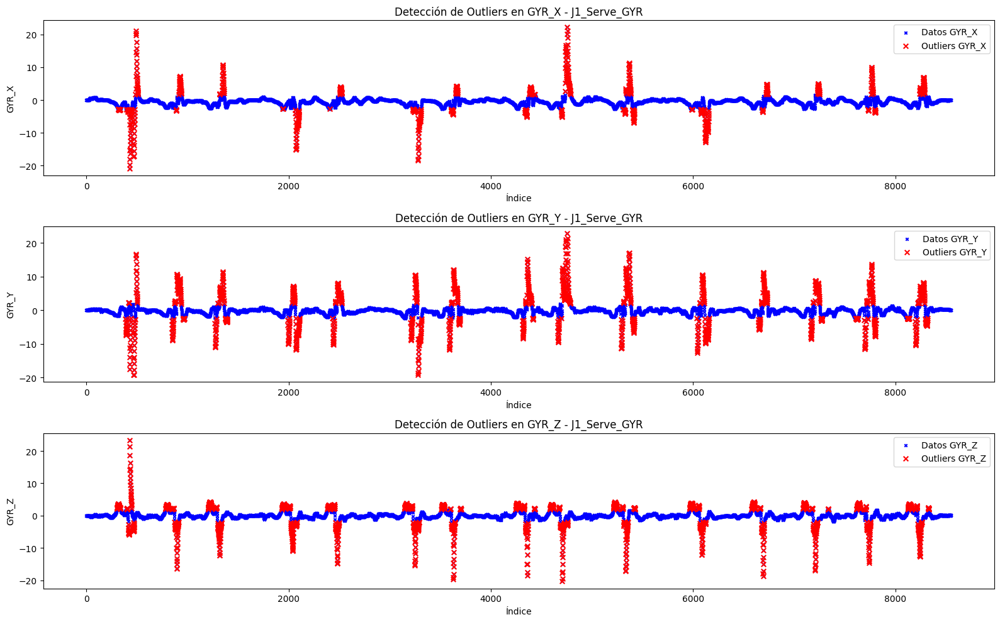

Nombre del DataFrame: J1_Smash_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.002794  0.004523  0.004789   1697803018988
1 -0.002528  0.003459  0.000266   1697803019011
2 -0.004922  0.002661 -0.002395   1697803019018
3 -0.002927 -0.000266 -0.004523   1697803019028
4  0.003193 -0.003459 -0.003858   1697803019039


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             1
GYR_Z             0
UNIX_TIMESTAMP    0
dtype: int64




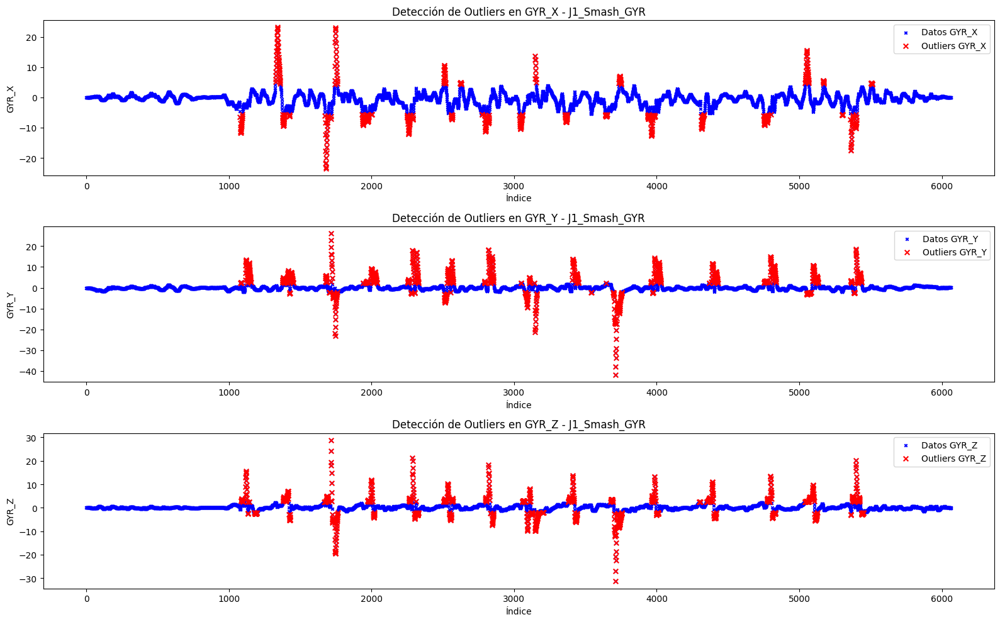

Nombre del DataFrame: J1_VD_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.002528  0.003193  0.003326   1697802770570
1 -0.001330  0.000798 -0.000665   1697802770590
2  0.002927 -0.000399  0.000266   1697802770602
3  0.001995 -0.001330  0.004656   1697802770611
4 -0.002528 -0.004257  0.003991   1697802770621


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             2
GYR_Z             0
UNIX_TIMESTAMP    0
dtype: int64




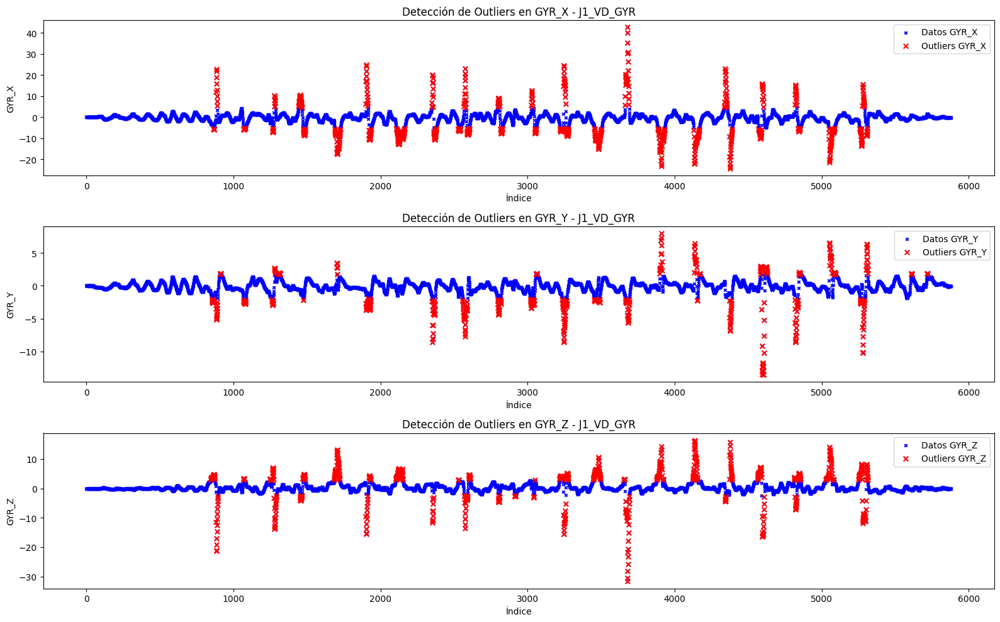

Nombre del DataFrame: J1_VR_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.001064  0.004789 -0.002128   1697802832724
1 -0.001596 -0.001995  0.000931   1697802832744
2 -0.003592 -0.004257 -0.003858   1697802832753
3  0.001197 -0.002661  0.003858   1697802832765
4 -0.004390  0.003060  0.001197   1697802832776


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             1
GYR_Z             0
UNIX_TIMESTAMP    0
dtype: int64




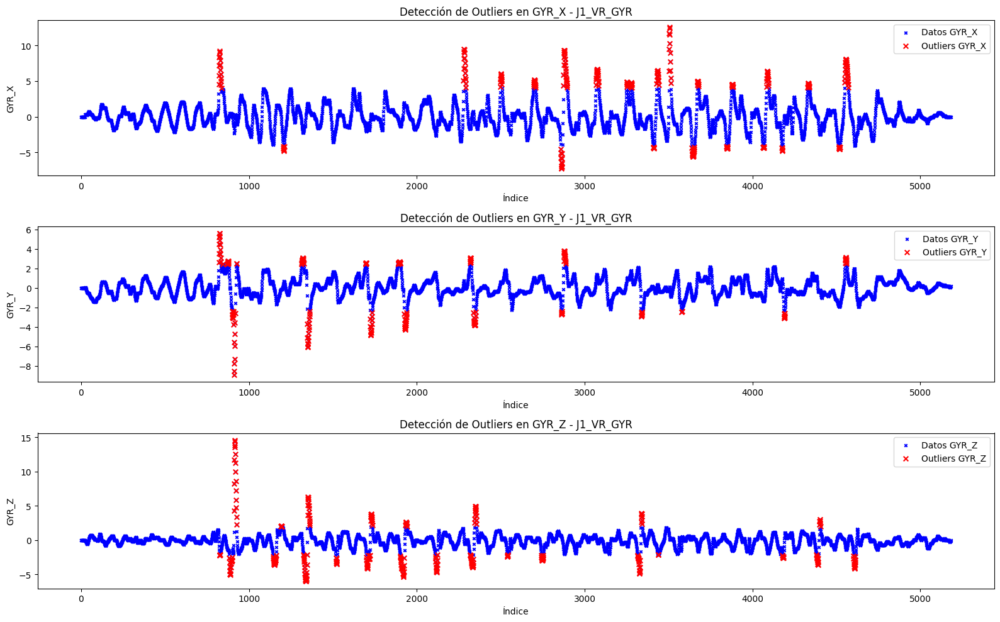

Nombre del DataFrame: J2_Dretes_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.002661  0.004789 -0.002661   1697803797960
1  0.003193 -0.001330 -0.002128   1697803797980
2 -0.002261 -0.004124 -0.000532   1697803797990
3  0.001596 -0.003193  0.004922   1697803798004
4 -0.002661  0.000798  0.000665   1697803798010


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             0
GYR_Z             2
UNIX_TIMESTAMP    0
dtype: int64




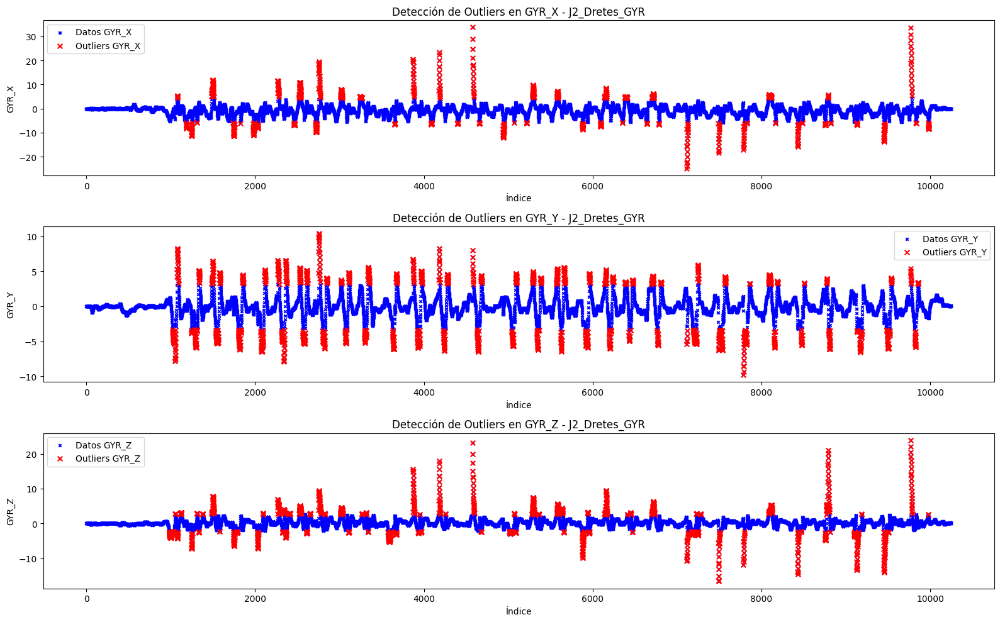

Nombre del DataFrame: J2_Reves_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.003459  0.001729  0.001596   1697803921551
1 -0.003060 -0.000266 -0.001197   1697803921560
2 -0.002927 -0.000532  0.001197   1697803921570
3  0.002927  0.000266  0.004922   1697803921581
4 -0.003991  0.003193 -0.001596   1697803921591


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             1
GYR_Z             5
UNIX_TIMESTAMP    0
dtype: int64




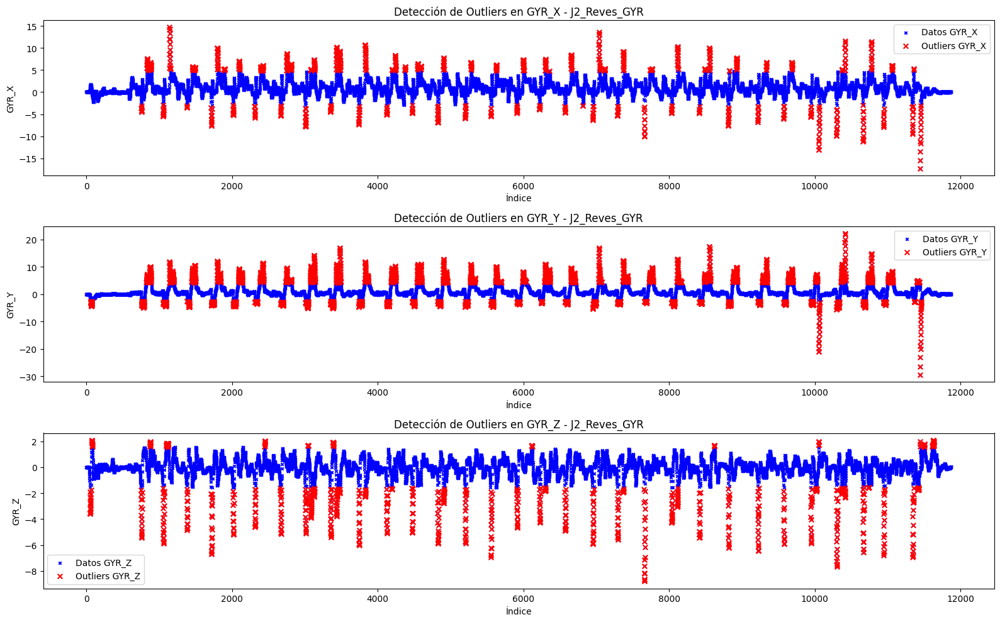

Nombre del DataFrame: J2_Serve_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.001064  0.001995 -0.002261   1697804289124
1  0.004257  0.000266  0.003459   1697804289145
2 -0.001463  0.003193 -0.001995   1697804289156
3 -0.002661  0.001862 -0.001596   1697804289165
4  0.002261  0.001463 -0.000532   1697804289174


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             0
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




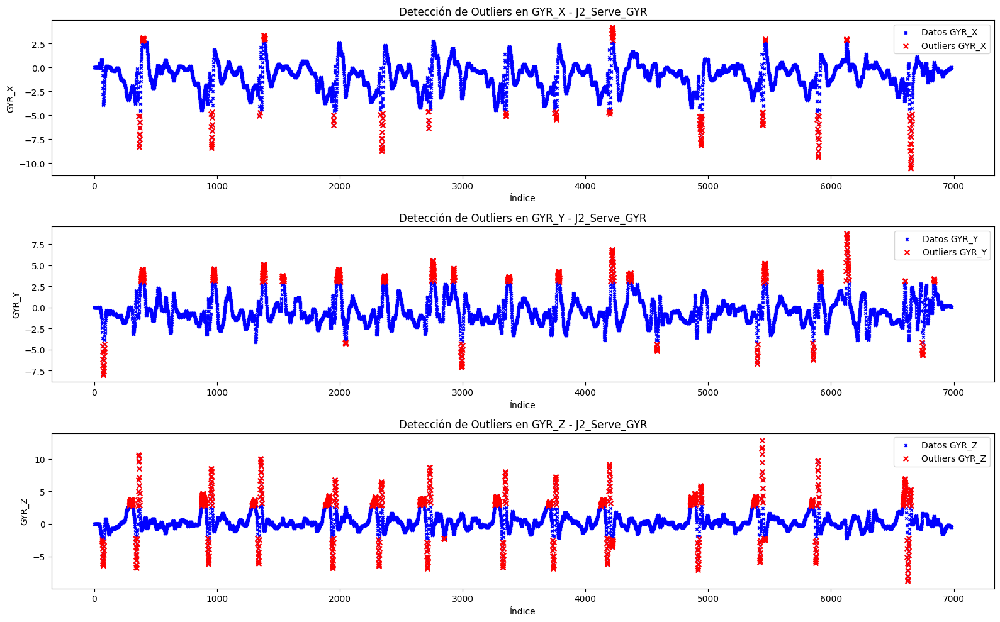

Nombre del DataFrame: J2_Smash_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.003725  0.003725  0.002794   1697804224948
1 -0.000399  0.004656 -0.004789   1697804224968
2 -0.001064  0.003193  0.003592   1697804224977
3 -0.002794 -0.003459  0.001463   1697804224988
4  0.003060 -0.001197  0.000665   1697804224997


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             1
GYR_Z             0
UNIX_TIMESTAMP    0
dtype: int64




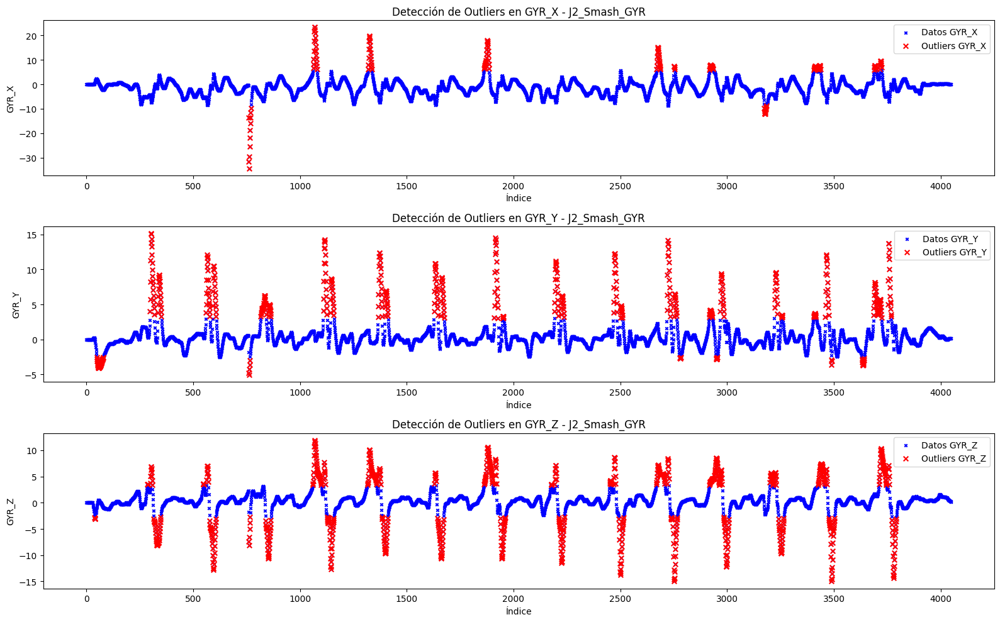

Nombre del DataFrame: J2_VD_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.001995  0.003060  0.004789   1697804080650
1 -0.000133 -0.001596  0.001064   1697804080669
2  0.004523 -0.001330  0.000399   1697804080679
3  0.003991  0.004124  0.002794   1697804080690
4 -0.000266 -0.002927 -0.004124   1697804080702


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             0
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




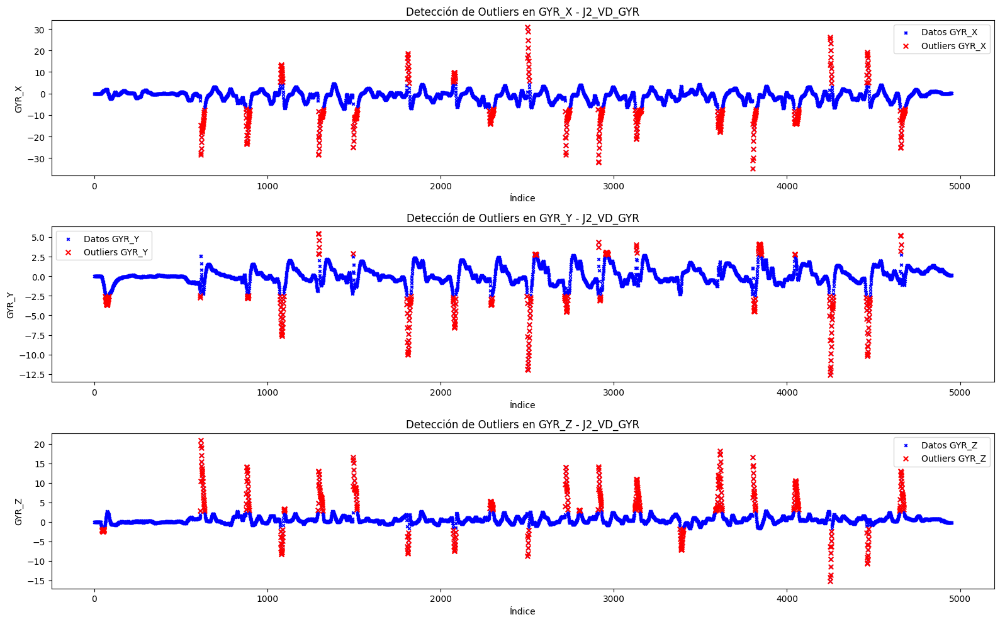

Nombre del DataFrame: J2_VR_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.000532  0.002395 -0.001862   1697804137691
1 -0.001330  0.000133 -0.002661   1697804137701
2 -0.001729  0.000133  0.003326   1697804137712
3  0.001729  0.000532  0.004656   1697804137720
4  0.001197  0.004124 -0.003193   1697804137732


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             0
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




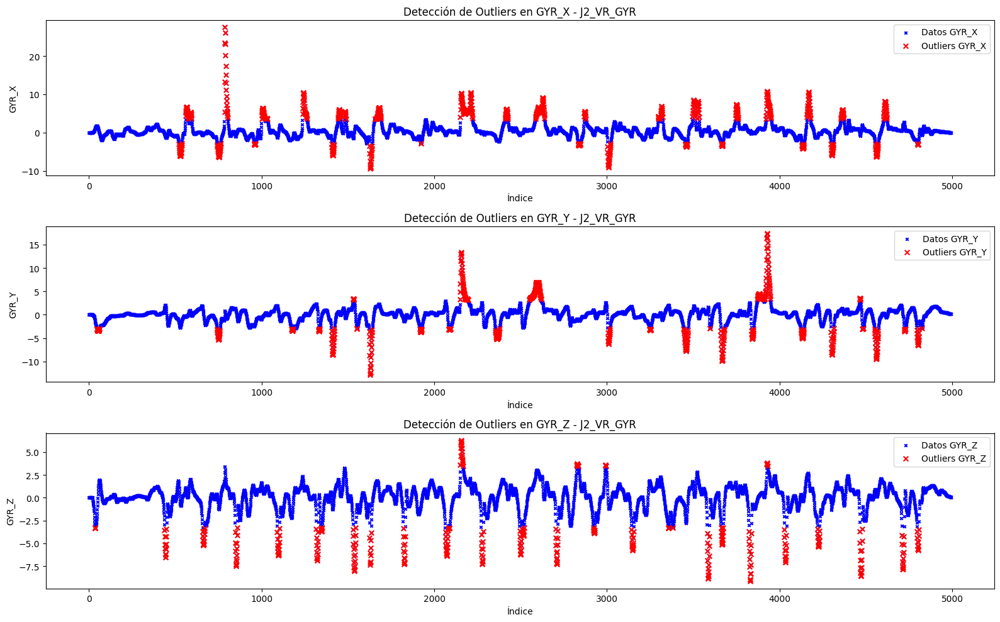

Nombre del DataFrame: J3_Dretes_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.002261  0.004390 -0.000931   1697900088755
1 -0.002927  0.001596 -0.004390   1697900088762
2  0.004390 -0.002395 -0.000931   1697900088775
3 -0.004257  0.001862  0.003326   1697900088780
4 -0.000532  0.004390  0.001862   1697900088791


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             1
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




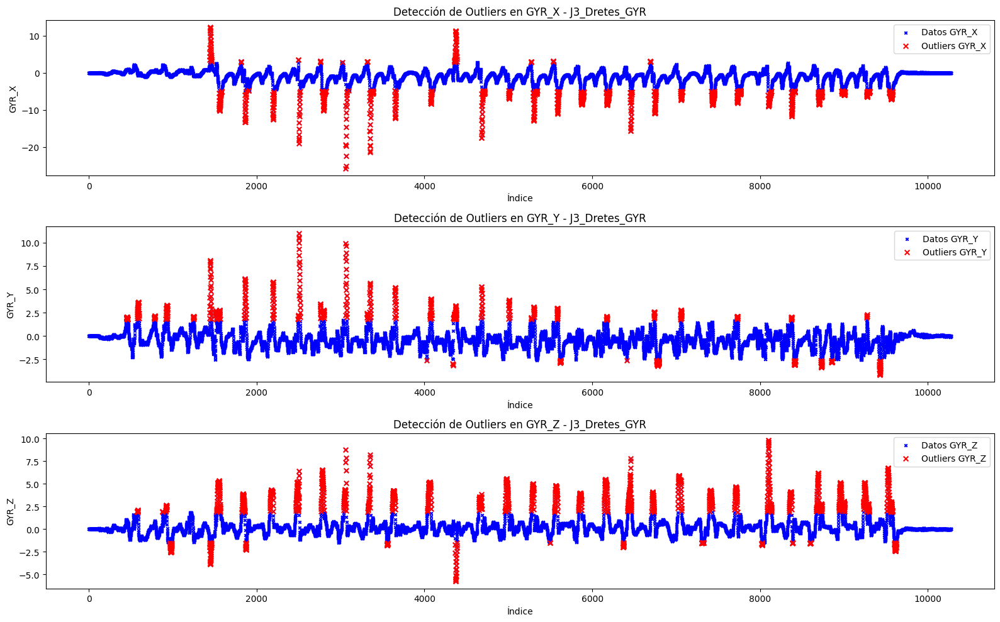

Nombre del DataFrame: J3_Reves_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.002128  0.003991  0.001862   1697900198707
1 -0.000266 -0.000931 -0.004523   1697900198717
2  0.001064 -0.002128  0.003858   1697900198727
3 -0.004257  0.004390  0.004656   1697900198737
4 -0.003858 -0.004124  0.001596   1697900198748


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             4
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




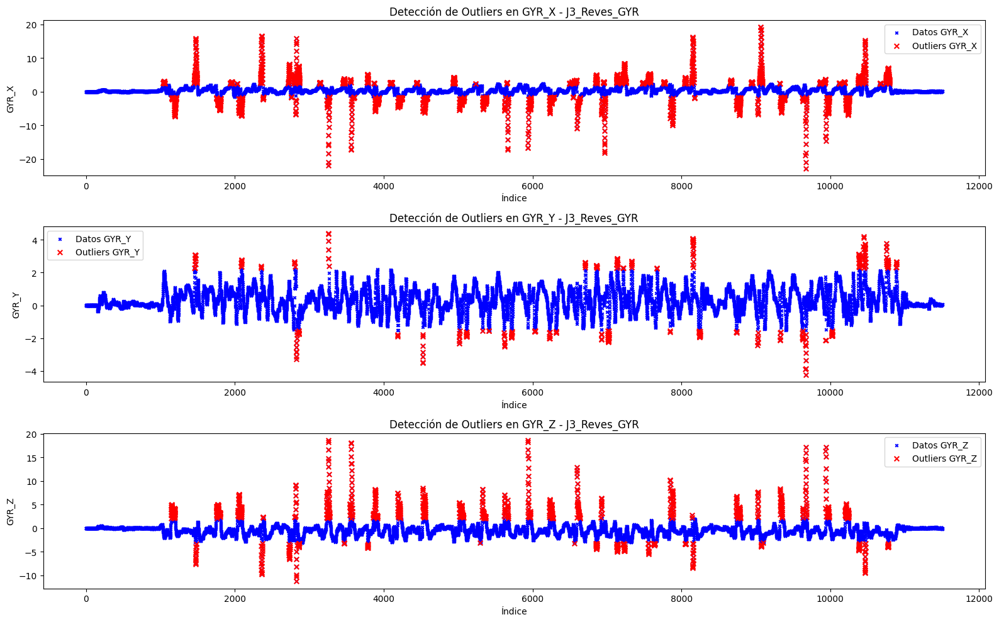

Nombre del DataFrame: J3_Serve_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.000266  0.002794 -0.000665   1697900589015
1  0.000266  0.002528  0.000798   1697900589035
2 -0.002528 -0.003991  0.002927   1697900589044
3 -0.001197 -0.000266  0.003725   1697900589055
4  0.001596 -0.003459 -0.004789   1697900589064


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             3
GYR_Y             1
GYR_Z             2
UNIX_TIMESTAMP    0
dtype: int64




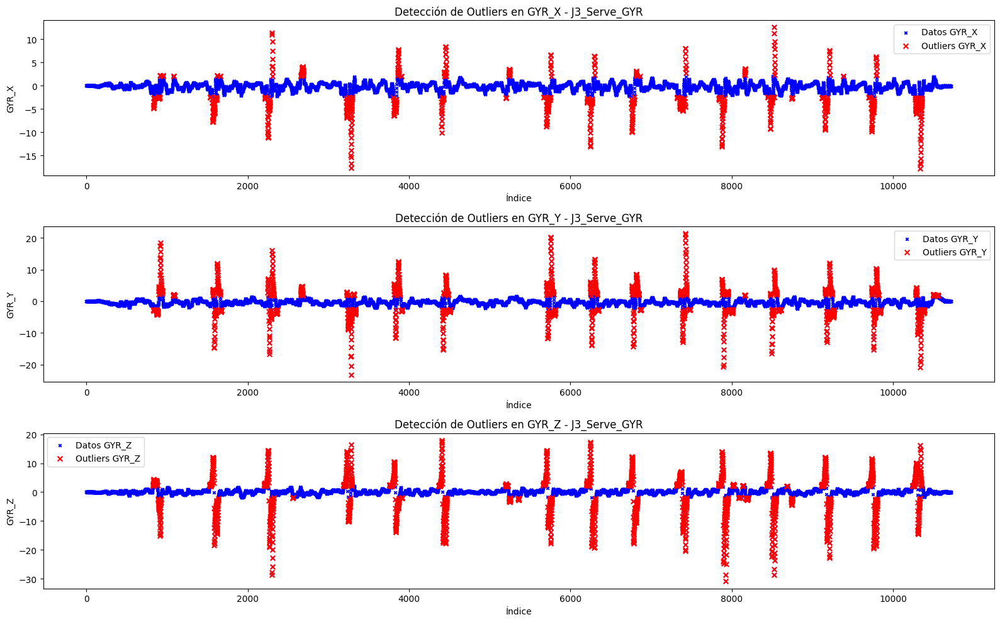

Nombre del DataFrame: J3_Smash_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.003459 -0.000266 -0.004523   1697900484195
1 -0.003991 -0.002794 -0.000931   1697900484208
2 -0.002395  0.000798 -0.003060   1697900484216
3 -0.001463 -0.004390  0.003592   1697900484225
4  0.001064 -0.002927 -0.002794   1697900484236


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             1
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




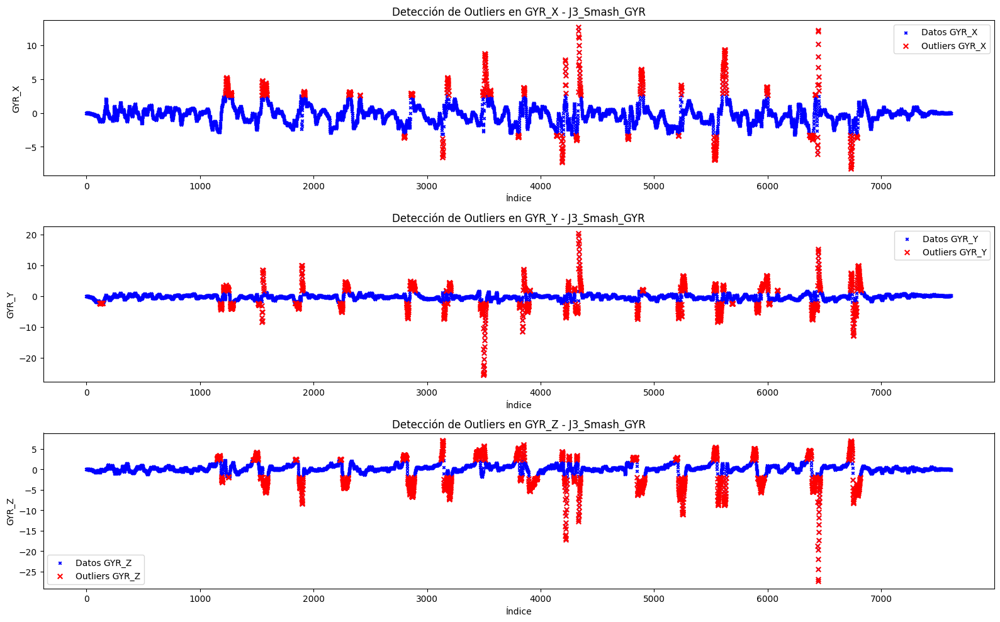

Nombre del DataFrame: J3_VD_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.001862 -0.001995  0.003592   1697900330291
1 -0.004390 -0.002528 -0.003193   1697900330300
2 -0.000399  0.003326  0.001862   1697900330311
3  0.001197 -0.002528 -0.003459   1697900330321
4 -0.002794 -0.000133  0.004390   1697900330332


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             4
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




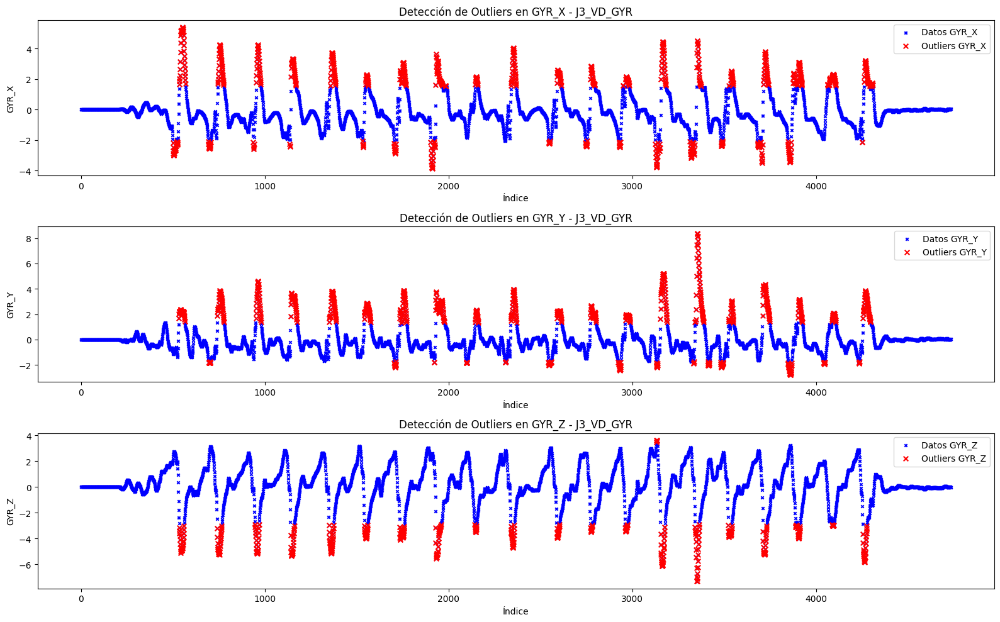

Nombre del DataFrame: J3_VR_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.001330 -0.004257  0.003060   1697900381820
1  0.000399  0.000665  0.000000   1697900381830
2 -0.000266  0.003592  0.003326   1697900381841
3 -0.000665 -0.004922  0.001862   1697900381850
4  0.001064 -0.003991  0.002794   1697900381864


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             1
GYR_Z             2
UNIX_TIMESTAMP    0
dtype: int64




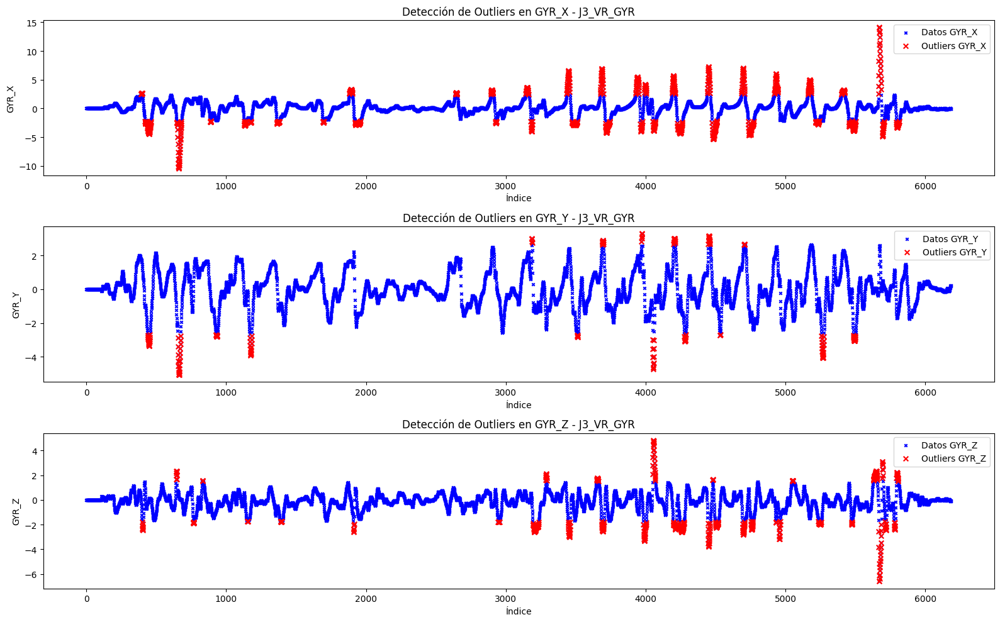

Nombre del DataFrame: J4_DRETES_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.003991  0.001197 -0.003459   1697901003551
1 -0.001596 -0.002128 -0.003459   1697901003561
2 -0.000532  0.001330 -0.002128   1697901003571
3  0.003326 -0.004789 -0.000665   1697901003588
4 -0.004656  0.000133  0.002395   1697901003592


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             3
GYR_Y             1
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




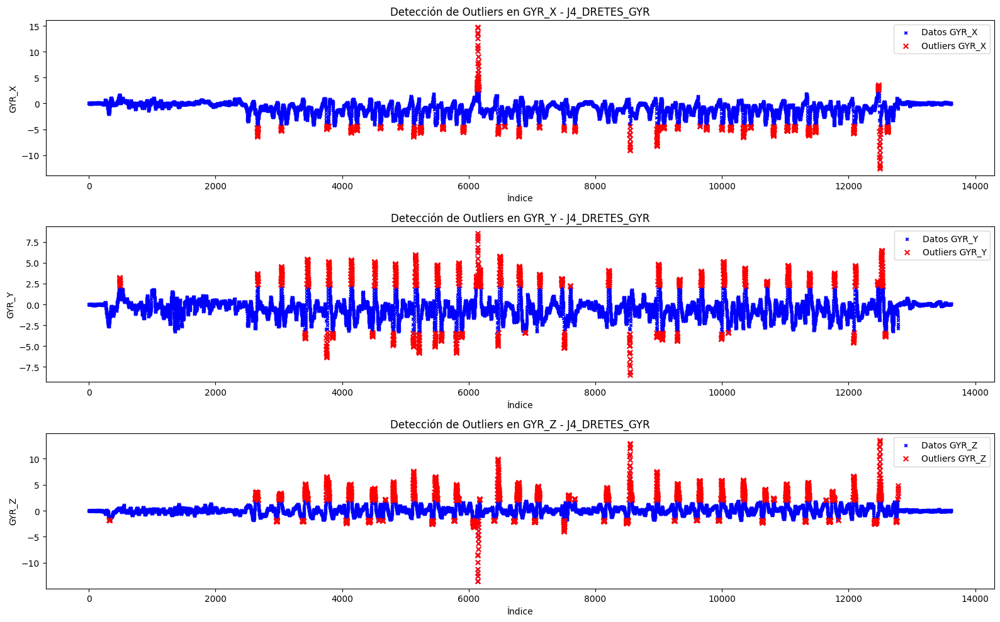

Nombre del DataFrame: J4_REVES_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.002395 -0.003459 -0.002261   1697901188805
1  0.003326 -0.004257 -0.004390   1697901188825
2 -0.003326 -0.001064 -0.004390   1697901188835
3  0.002395 -0.003326  0.000133   1697901188845
4 -0.001729 -0.001463 -0.000000   1697901188855


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             3
GYR_Z             4
UNIX_TIMESTAMP    0
dtype: int64




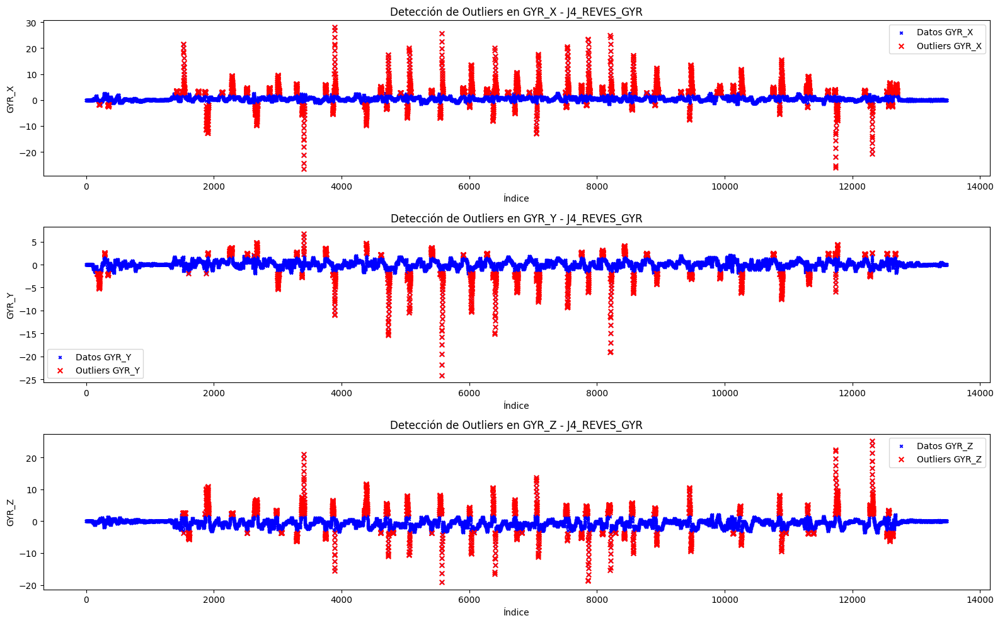

Nombre del DataFrame: J4_SERVE_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.002794  0.001463  0.003725   1697901630561
1 -0.004124  0.003991 -0.001064   1697901630581
2 -0.004922  0.001729  0.003592   1697901630591
3  0.001197 -0.004922 -0.002528   1697901630602
4  0.000133  0.002261 -0.001197   1697901630611


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             0
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




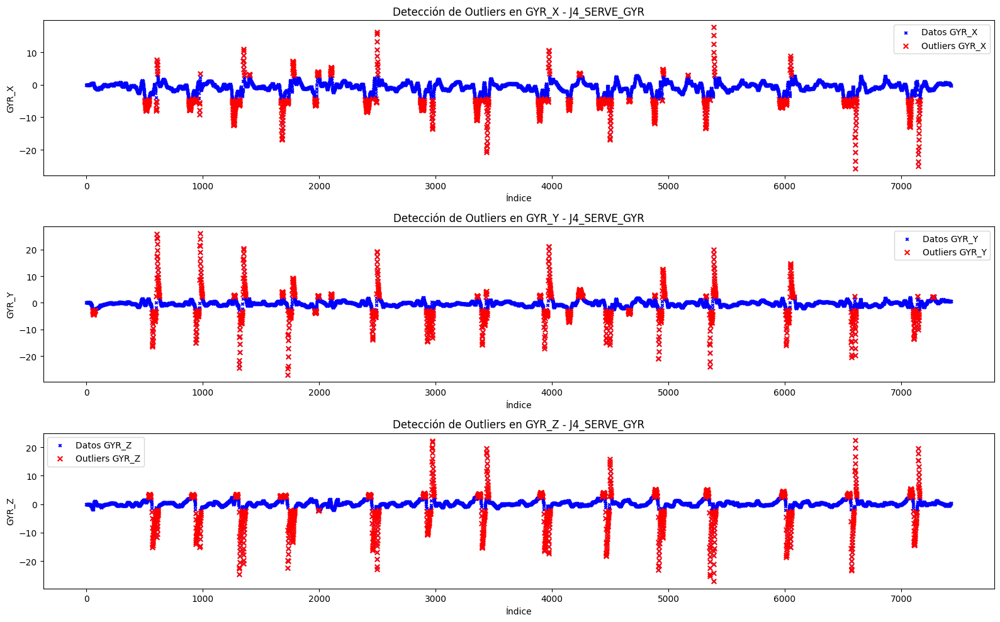

Nombre del DataFrame: J4_SMASH_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.002528 -0.003991  0.000931   1697901523060
1 -0.004656 -0.000532 -0.004124   1697901523061
2  0.003193  0.001862  0.003459   1697901523092
3 -0.003592  0.000665 -0.004124   1697901523093
4 -0.002528  0.002128  0.002794   1697901523093


No hay valores nulos en el DataFrame.
No hay valores ceros en el DataFrame.




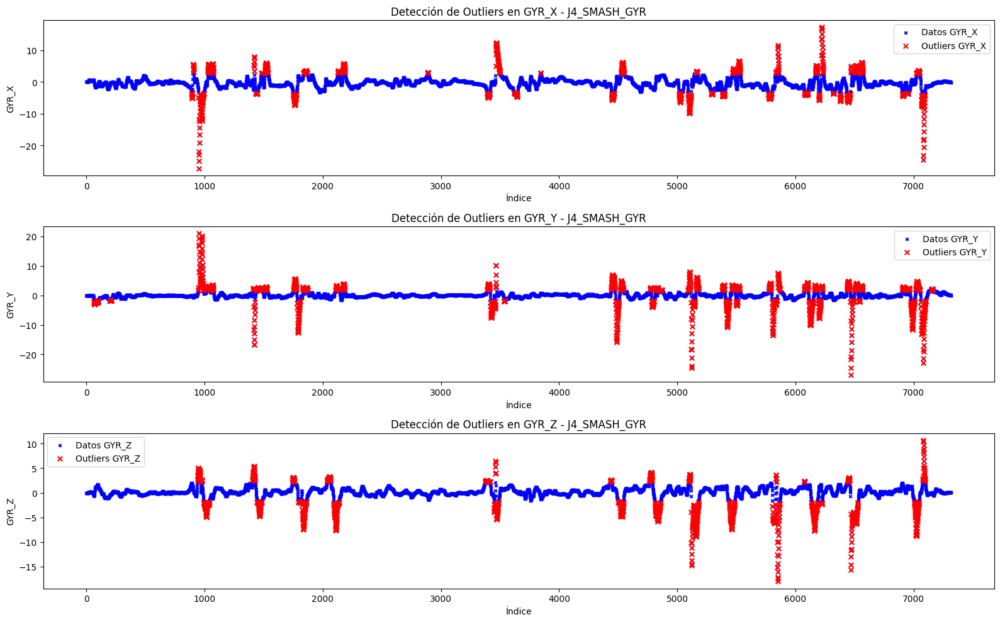

Nombre del DataFrame: J4_VD_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.001463  0.001197 -0.003725   1697901349046
1  0.003193 -0.001463  0.002261   1697901349055
2 -0.003459 -0.001729 -0.000133   1697901349066
3 -0.000931  0.003592  0.003991   1697901349075
4 -0.003858 -0.004390  0.000266   1697901349086


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             1
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




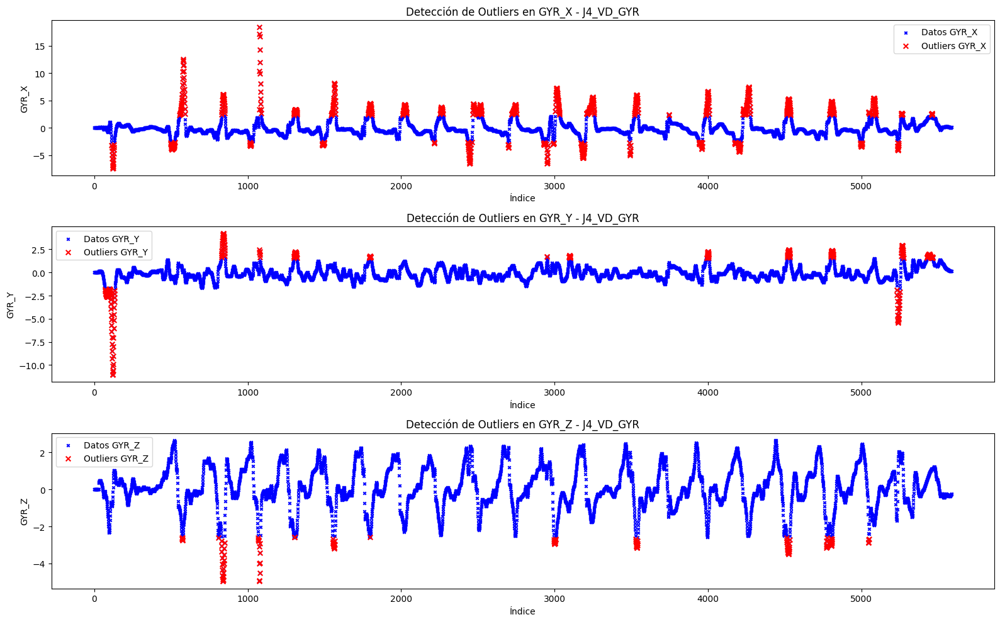

Nombre del DataFrame: J4_VR_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.001995  0.001862  0.003326   1697901407918
1 -0.001064  0.002528 -0.001197   1697901407928
2 -0.002261  0.003193  0.001463   1697901407943
3 -0.003858  0.002395  0.000532   1697901407948
4 -0.001197  0.004257  0.000133   1697901407960


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             0
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




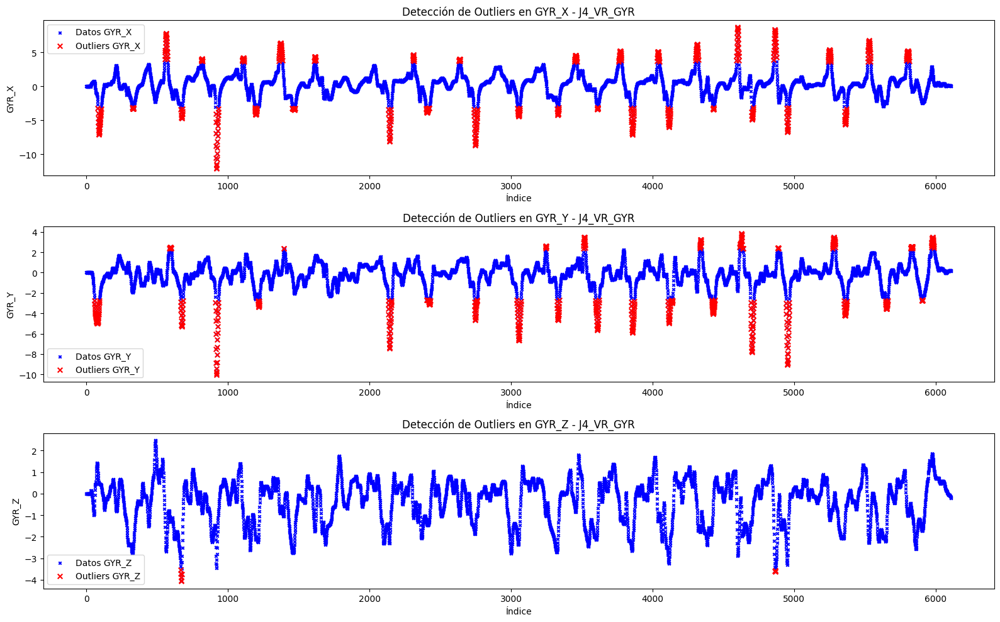

Nombre del DataFrame: J5_Dreta_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.000532 -0.000399  0.002927   1697902014793
1  0.003193  0.001463 -0.002395   1697902014814
2  0.002661 -0.004523 -0.004656   1697902014828
3 -0.003193  0.001596  0.001596   1697902014834
4 -0.002661 -0.002661  0.000266   1697902014845


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             3
GYR_Y             4
GYR_Z             5
UNIX_TIMESTAMP    0
dtype: int64




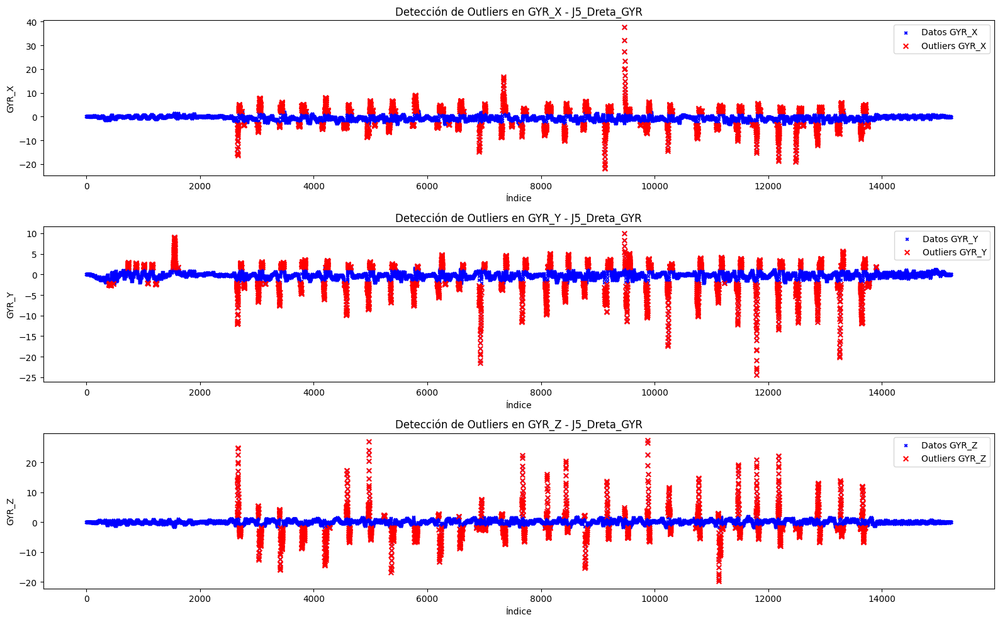

Nombre del DataFrame: J5_Reves_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.003326 -0.002661 -0.001995   1697902291724
1  0.001197 -0.000532 -0.003592   1697902291745
2 -0.001197  0.002927  0.004390   1697902291754
3  0.000798 -0.002395 -0.000798   1697902291765
4 -0.003991  0.004124 -0.003991   1697902291778


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             2
GYR_Z             0
UNIX_TIMESTAMP    0
dtype: int64




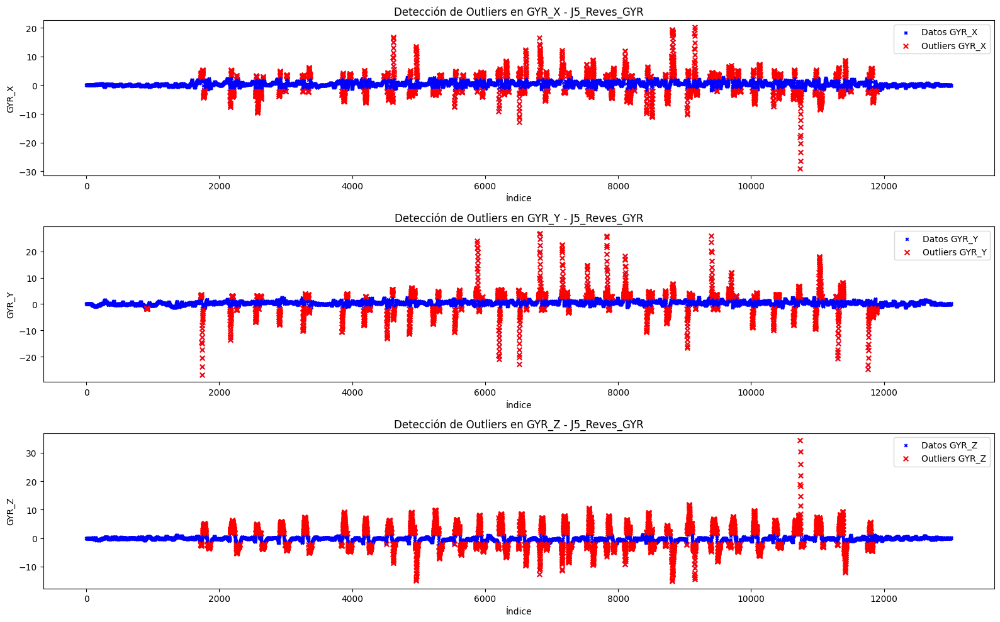

Nombre del DataFrame: J5_Serve_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.003193  0.000133  0.004789   1697902722851
1  0.001995  0.001064  0.002528   1697902722871
2 -0.000532  0.003991  0.000798   1697902722881
3  0.000798 -0.001995 -0.003326   1697902722891
4 -0.003858 -0.000133 -0.000133   1697902722901


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             2
GYR_Y             3
GYR_Z             2
UNIX_TIMESTAMP    0
dtype: int64




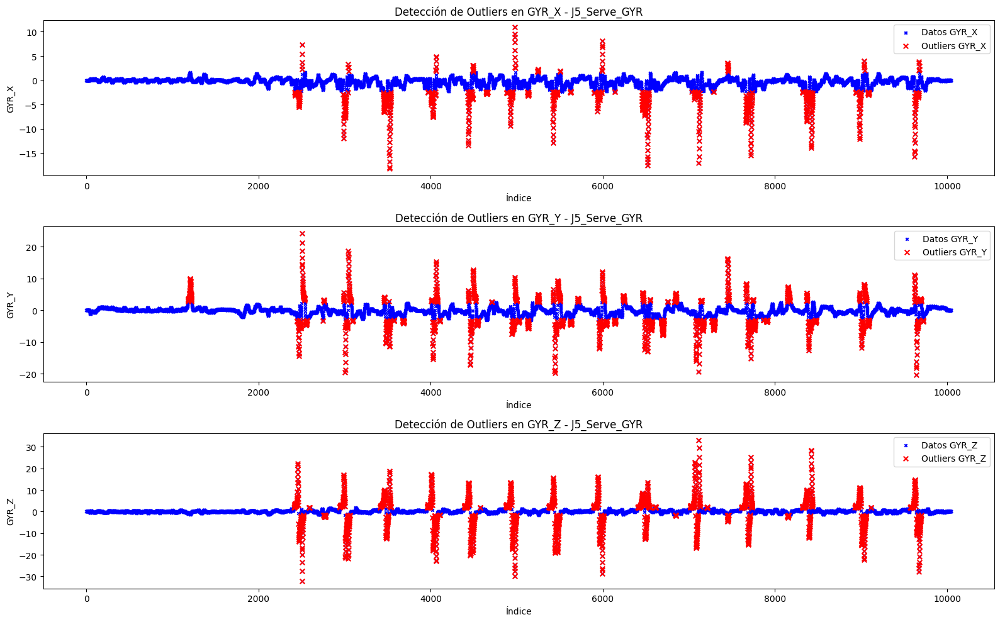

Nombre del DataFrame: J5_Smash_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.003326  0.002528  0.003725   1697902631612
1 -0.002794  0.001463  0.004390   1697902631622
2 -0.004922  0.004523  0.002528   1697902631632
3  0.003326 -0.001862 -0.003326   1697902631642
4  0.004257  0.002794 -0.003592   1697902631653


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             3
GYR_Y             3
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




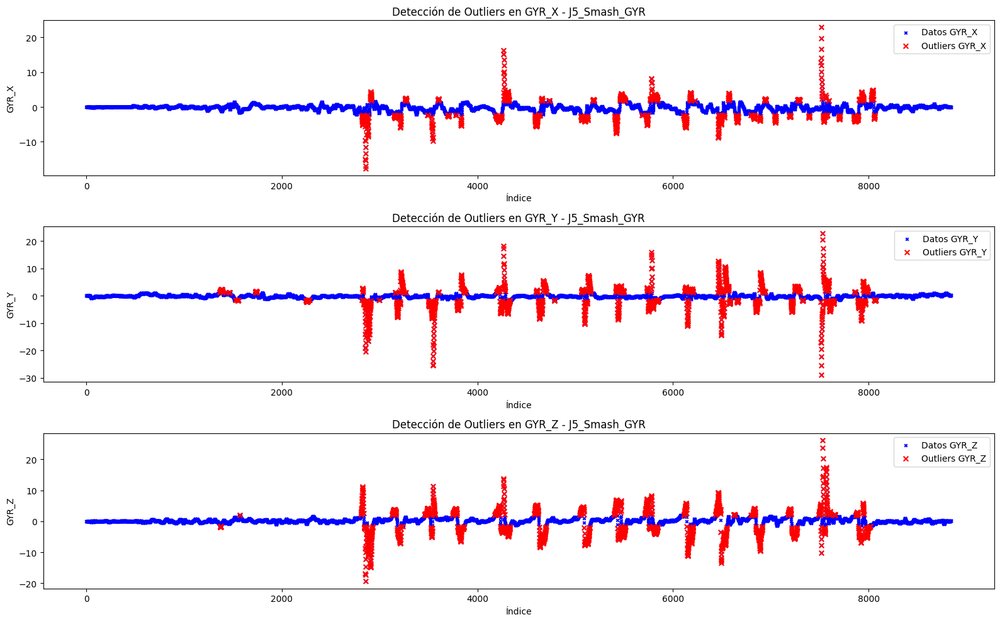

Nombre del DataFrame: J5_VD_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.004390 -0.002661 -0.001463   1697902425193
1 -0.000931 -0.003858 -0.005055   1697902425202
2  0.001995 -0.003991 -0.002261   1697902425214
3 -0.001862  0.002128 -0.003060   1697902425223
4  0.005055  0.004257 -0.003858   1697902425233


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             0
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




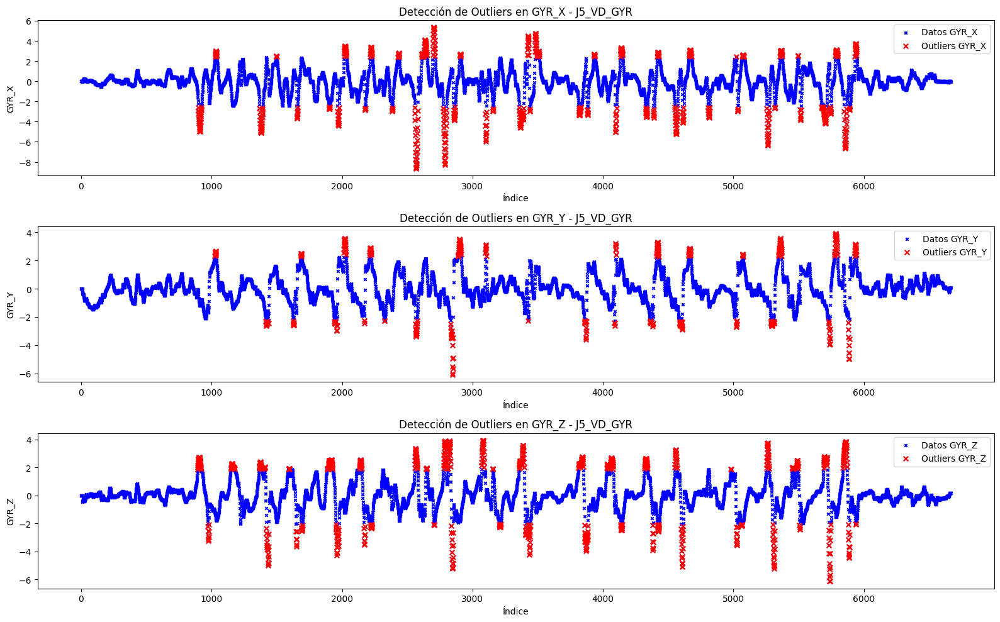

Nombre del DataFrame: J5_VR_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.003060 -0.003858 -0.004390   1697902494343
1  0.003326 -0.001995 -0.003725   1697902494364
2 -0.000532  0.004789  0.004124   1697902494373
3 -0.003326  0.002661 -0.003193   1697902494383
4  0.002395  0.003459 -0.000798   1697902494393


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             20
GYR_Y              6
GYR_Z              6
UNIX_TIMESTAMP     0
dtype: int64




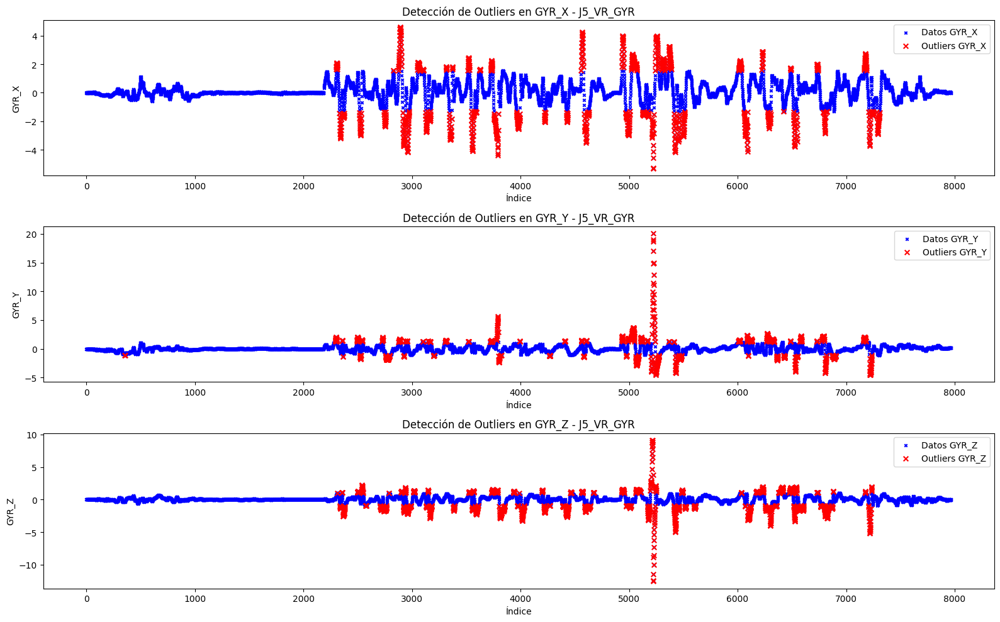

Nombre del DataFrame: J6_DRETES_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.004789 -0.004257 -0.004789   1697903225799
1 -0.004124 -0.004257  0.003193   1697903225808
2 -0.002528 -0.000000  0.001995   1697903225819
3  0.003193  0.004656 -0.003592   1697903225835
4 -0.003193 -0.002395  0.003858   1697903225839


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             2
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




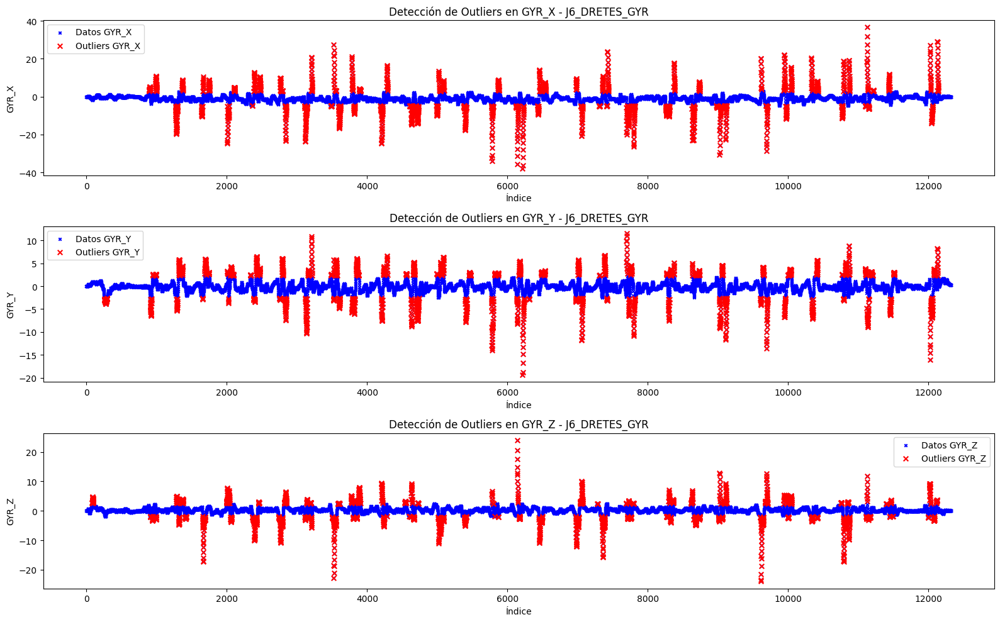

Nombre del DataFrame: J6_REVES_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.001197  0.004124  0.002128   1697903358822
1 -0.001330 -0.001596 -0.000665   1697903358842
2 -0.001729  0.003060  0.002794   1697903358854
3  0.001995  0.002528  0.004390   1697903358862
4 -0.004789  0.004257  0.002794   1697903358872


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             2
GYR_Z             3
UNIX_TIMESTAMP    0
dtype: int64




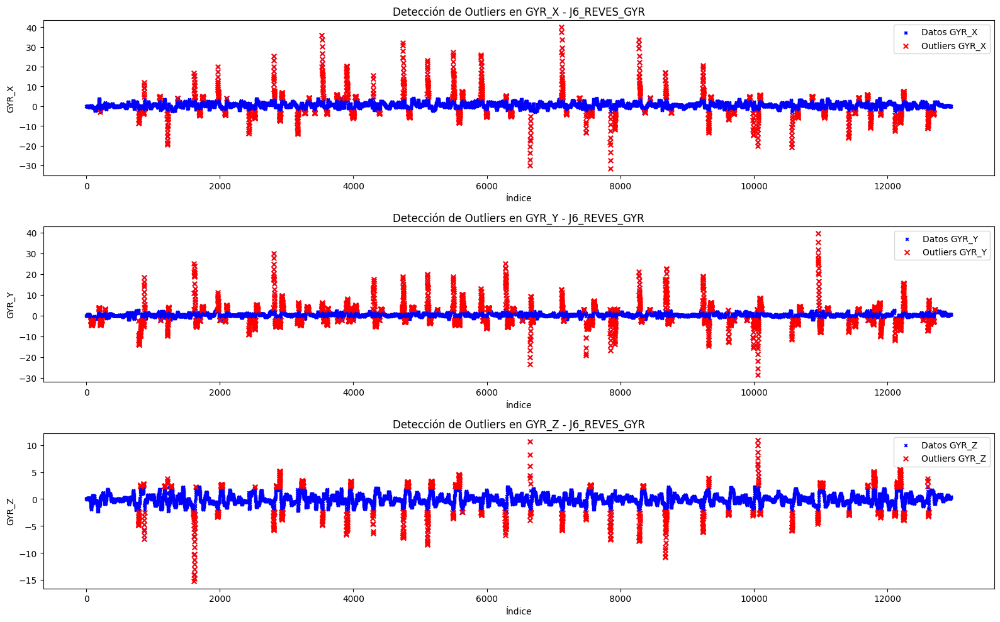

Nombre del DataFrame: J6_SERVE_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0  0.000532  0.001197 -0.003459   1697903991022
1  0.001064  0.004257  0.002528   1697903991031
2 -0.000133 -0.003193 -0.004390   1697903991044
3  0.000798  0.001197  0.004523   1697903991052
4  0.003326 -0.003193 -0.003858   1697903991062


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             1
GYR_Y             2
GYR_Z             5
UNIX_TIMESTAMP    0
dtype: int64




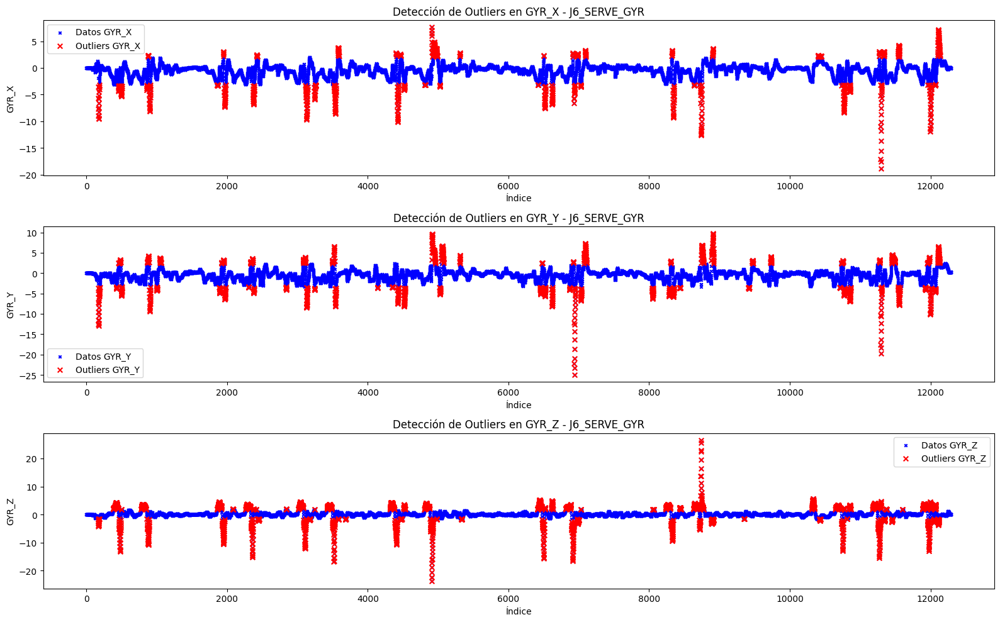

Nombre del DataFrame: J6_SMASH_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.002661 -0.003060 -0.001463   1697903901130
1 -0.003991  0.000665  0.001995   1697903901141
2  0.002528 -0.004257 -0.003991   1697903901150
3  0.001596  0.001995  0.004656   1697903901160
4 -0.003326  0.003193 -0.001729   1697903901170


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             0
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




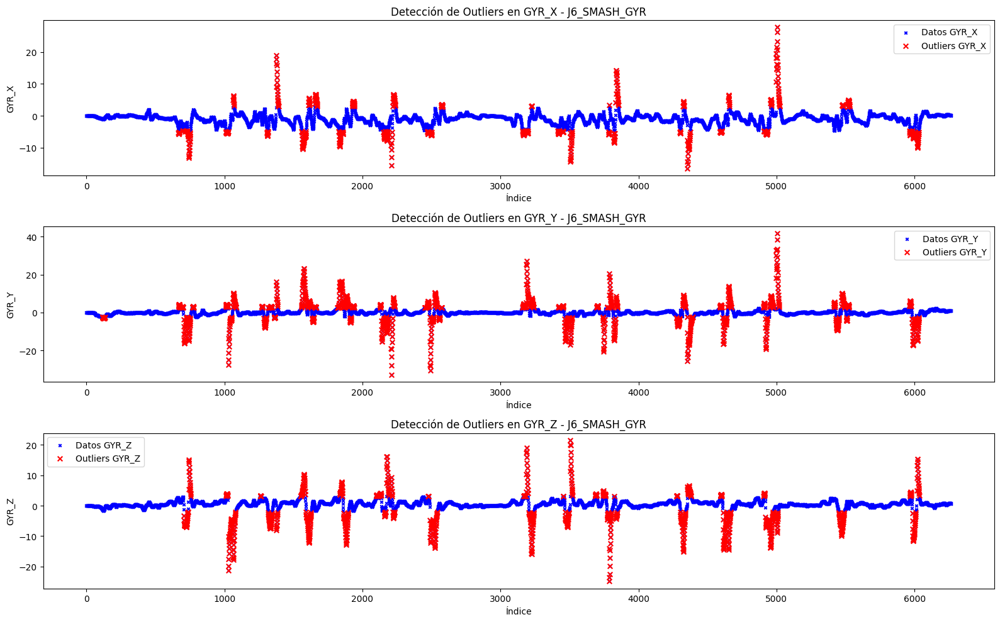

Nombre del DataFrame: J6_VD_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.003991  0.004257 -0.002794   1697903709917
1  0.000133  0.004257  0.004523   1697903709937
2 -0.003592  0.000798 -0.001463   1697903709947
3  0.001064 -0.003060  0.001862   1697903709958
4 -0.003592 -0.004922 -0.004390   1697903709967


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             0
GYR_Y             2
GYR_Z             1
UNIX_TIMESTAMP    0
dtype: int64




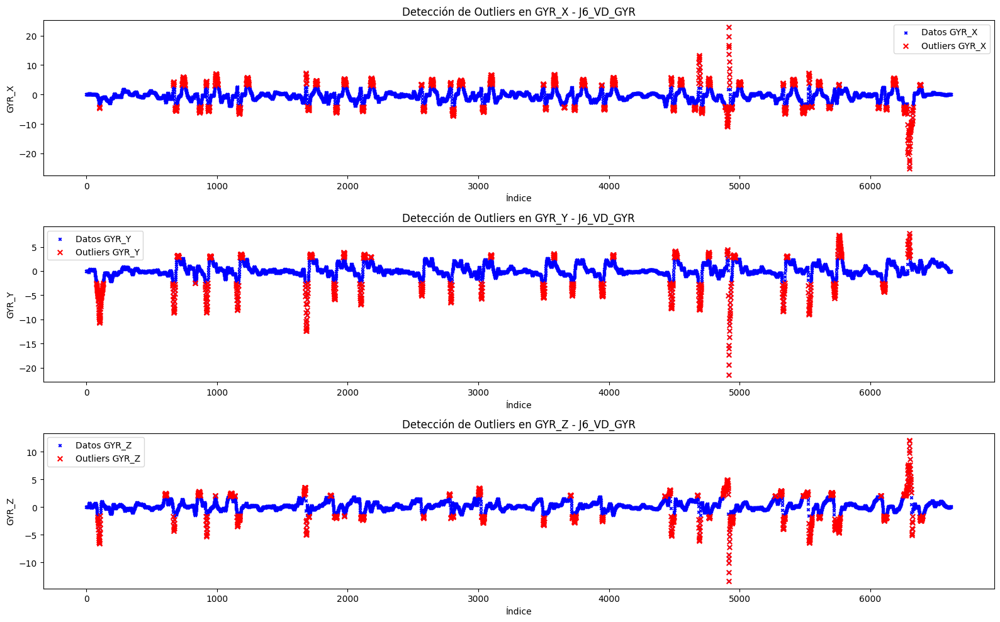

Nombre del DataFrame: J6_VR_GYR
Vista previa del DataFrame:
      GYR_X     GYR_Y     GYR_Z  UNIX_TIMESTAMP
0 -0.004390  0.001862 -0.000532   1697903779508
1  0.002261 -0.001330 -0.004922   1697903779518
2  0.003592  0.001197 -0.000133   1697903779528
3  0.004922 -0.004789 -0.002395   1697903779538
4  0.003592 -0.001330 -0.003326   1697903779549


No hay valores nulos en el DataFrame.
Cantidad de ceros por columna:
GYR_X             4
GYR_Y             3
GYR_Z             2
UNIX_TIMESTAMP    0
dtype: int64




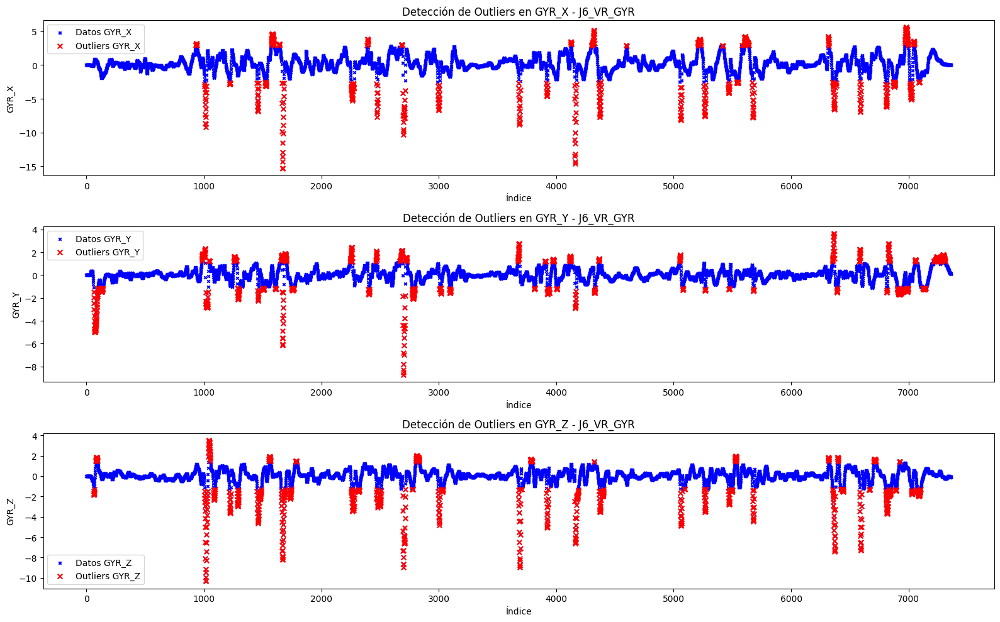

In [16]:


# Directorio principal donde se encuentran todos los archivos CSV
main_folder = r'C:/Users/Holacons/OneDrive - Vueling Airlines, S.A/Escritorio/TFM/Proves Stroke Count'

# Función para detectar outliers usando el método IQR
def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers

# Lista para almacenar los DataFrames y sus respectivos nombres
dfs_with_names = []

# Recorrer todas las carpetas y archivos dentro del directorio principal
for root, dirs, files in os.walk(main_folder):
    for file in files:
        if file.endswith('.csv') and 'GYR' in file:
            file_path = os.path.join(root, file)
            # Leer el archivo CSV como DataFrame
            df = pd.read_csv(file_path)
            # Eliminar la columna 'DATE' si existe
            if 'DATE' in df.columns:
                df = df.drop(columns=['DATE'])
            # Obtener el nombre del archivo sin la extensión .csv y reemplazar espacios por _
            df_name = file.split('.')[0].replace(' ', '_')
            # Almacenar el DataFrame con su nombre modificado
            dfs_with_names.append((df_name, df))

# Verificar valores nulos, contar ceros y detectar outliers en cada DataFrame
for name, df in dfs_with_names:
    print(f"Nombre del DataFrame: {name}")
    
    # Mostrar las primeras filas del DataFrame como ejemplo
    print("Vista previa del DataFrame:")
    print(df.head())
    print("\n")
    
    # Verificar valores nulos
    if df.isnull().values.any():
        print("Hay valores nulos en el DataFrame.")
        print(df.isnull().sum())  # Mostrar la cantidad de valores nulos por columna
    else:
        print("No hay valores nulos en el DataFrame.")

    # Contar valores ceros por columna
    zero_counts = (df == 0).sum()
    if zero_counts.any():
        print("Cantidad de ceros por columna:")
        print(zero_counts)
    else:
        print("No hay valores ceros en el DataFrame.")
    
    print("\n")
    
    # Detectar outliers en cada columna GYR_X, GYR_Y, GYR_Z
    outliers_gyr_x = detect_outliers_iqr(df['GYR_X'])
    outliers_gyr_y = detect_outliers_iqr(df['GYR_Y'])
    outliers_gyr_z = detect_outliers_iqr(df['GYR_Z'])

    # Graficar los puntos y resaltar los outliers en cada eje
    plt.figure(figsize=(16, 10))

    # GYR_X
    plt.subplot(3, 1, 1)
    plt.scatter(df.index, df['GYR_X'], label='Datos GYR_X', color='blue', s=10, marker='x')
    plt.scatter(outliers_gyr_x.index, outliers_gyr_x, label='Outliers GYR_X', color='red', s=30, marker='x')
    plt.xlabel('Índice')
    plt.ylabel('GYR_X')
    plt.title(f'Detección de Outliers en GYR_X - {name}')
    plt.legend()

    # GYR_Y
    plt.subplot(3, 1, 2)
    plt.scatter(df.index, df['GYR_Y'], label='Datos GYR_Y', color='blue', s=10, marker='x')
    plt.scatter(outliers_gyr_y.index, outliers_gyr_y, label='Outliers GYR_Y', color='red', s=30, marker='x')
    plt.xlabel('Índice')
    plt.ylabel('GYR_Y')
    plt.title(f'Detección de Outliers en GYR_Y - {name}')
    plt.legend()

    # GYR_Z
    plt.subplot(3, 1, 3)
    plt.scatter(df.index, df['GYR_Z'], label='Datos GYR_Z', color='blue', s=10, marker='x')
    plt.scatter(outliers_gyr_z.index, outliers_gyr_z, label='Outliers GYR_Z', color='red', s=30, marker='x')
    plt.xlabel('Índice')
    plt.ylabel('GYR_Z')
    plt.title(f'Detección de Outliers en GYR_Z - {name}')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [17]:


# Función para aplicar filtrado gaussiano y normalización
def process_array(df, column_names, sigma=5):
    for column in column_names:
        # Aplicar filtrado gaussiano
        df[column] = gaussian_filter(df[column], sigma=sigma)
        # Normalizar la señal entre 0 y 1
        df[column] = (df[column] - np.min(df[column])) / (np.max(df[column]) - np.min(df[column]))
    return df

# Función para procesar y guardar DataFrames
def process_and_save(df, output_folder, player_name, golpe_name):
    # Eliminar la columna 'DATE' si existe
    if 'DATE' in df.columns:
        df = df.drop(columns=['DATE'])

    # Convertir numpy.ndarray a DataFrame si es necesario
    if not isinstance(df, pd.DataFrame):
        df = pd.DataFrame(df)

    # Procesar el DataFrame
    columns_to_process = ['GYR_X', 'GYR_Y', 'GYR_Z']
    df = process_array(df, columns_to_process)

    # Crear la carpeta del jugador si no existe
    player_folder = os.path.join(output_folder, player_name)
    os.makedirs(player_folder, exist_ok=True)

    # Construir el nombre del archivo
    file_name = f"{player_name}_{golpe_name}_GYR.csv"
    file_path = os.path.join(player_folder, file_name)

    # Guardar el DataFrame en un archivo CSV
    df.to_csv(file_path, index=False)
    print(f"Archivo guardado: {file_path}")

# Directorio principal donde se encuentran todos los archivos CSV
main_folder = r'C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\Proves Stroke Count'
# Directorio de salida
output_folder = r"C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio"
# Lista para almacenar los DataFrames y sus respectivos nombres
dfs_with_names = []

# Recorrer todas las carpetas y archivos dentro del directorio principal
for root, dirs, files in os.walk(main_folder):
    for file in files:
        if file.endswith('.csv') and 'GYR' in file:
            file_path = os.path.join(root, file)
            # Leer el archivo CSV como DataFrame
            df = pd.read_csv(file_path)
            # Almacenar el DataFrame con su nombre original y DataFrame
            df_name = file.split('.')[0].replace(' ', '_')
            dfs_with_names.append((df_name, df))

# Procesar y guardar cada DataFrame para el jugador J1, J2, J3, etc.
for df_name, df in dfs_with_names:
    # Extraer jugador y golpe del nombre del DataFrame
    player_name, golpe_name, _ = df_name.split('_')

    # Llamar a la función para procesar y guardar el DataFrame
    process_and_save(df, output_folder, player_name, golpe_name)


Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J1\J1_Dretes_GYR.csv
Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J1\J1_Reves_GYR.csv
Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J1\J1_Serve_GYR.csv
Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J1\J1_Smash_GYR.csv
Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J1\J1_VD_GYR.csv
Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J1\J1_VR_GYR.csv
Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J2\J2_Dretes_GYR.csv
Archivo guardado: C:\Users\Holacons\OneDrive - Vueling Airlines, S.A\Escritorio\TFM\giroscopio_limpio\J2\J2_Reves_GYR.csv
Archivo guardado: C:\Users\H